# London Parks EEEEEEE (^_^)
I loooove that London has so many parks and greenspaces and I am determined to run in as many of them as possible! I feel like I am constantly underground in the tube and want to use running as a way to explore the city better wooohooooo! It is hard to keep track of soooo this will allow me to find all the parks I want to run in, and keep track of which ones I have ran at 

## Setup

In [74]:
# Import libraries
import folium
import pandas as pd
import numpy as np
import geopandas as gpd
import fiona
import seaborn as sns
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import requests
import polyline
from shapely.geometry import LineString
from datetime import datetime

In [75]:
# Open shapefile using geopandas
gdf = gpd.read_file("GiGL_SpacesToVisit_Open_Shp/GiGL_SpacesToVisit_region.shp")
gdf.head(3)

,SiteName,SiteID,PrimaryUse,Borough,AreaHa,Easting,Northing,Qualifier,Access,DataSource,DataVersio,ReleaseDat,Copyright,geometry
0,Warley Street Drain,OS_Hv_0855,River,Havering,0.7073,559598,187386,Centroid,De facto,Data source: various,15,Oct 2024,Created by Greenspace Information for Greater ...,"POLYGON ((559600.2 187076.099, 559598.098 1870..."
1,Thames Chase Community Forest East,OS_Hv_0045,Other recreational,Havering,16.3096,558721,186006,Centroid,Free,Data source: various,15,Oct 2024,Created by Greenspace Information for Greater ...,"POLYGON ((558522.002 185684.498, 558523.601 18..."
2,St Mary Magdelane Churchyard,OS_Hv_0454,Cemetery/churchyard,Havering,0.3232,558748,184864,Centroid,Free,Data source: various,15,Oct 2024,Created by Greenspace Information for Greater ...,"POLYGON ((558804.403 184872.6, 558798.599 1848..."


In [76]:
# Column information
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   SiteName    4368 non-null   object  
 1   SiteID      4368 non-null   object  
 2   PrimaryUse  4367 non-null   object  
 3   Borough     4368 non-null   object  
 4   AreaHa      4368 non-null   float64 
 5   Easting     4368 non-null   int64   
 6   Northing    4368 non-null   int64   
 7   Qualifier   4368 non-null   object  
 8   Access      4368 non-null   object  
 9   DataSource  4368 non-null   object  
 10  DataVersio  4368 non-null   object  
 11  ReleaseDat  4368 non-null   object  
 12  Copyright   4368 non-null   object  
 13  geometry    4368 non-null   geometry
dtypes: float64(1), geometry(1), int64(2), object(10)
memory usage: 477.9+ KB


In [77]:
# Look for greenspaces
gdf['PrimaryUse'].value_counts()

PrimaryUse
Park                           1031
Amenity green space             817
Formal garden                   372
Recreation ground               340
Cemetery/churchyard             333
Nature reserve                  291
Play space                      200
Playing fields                  191
Public woodland                 143
Civic/market square             134
River                            92
Walking/cycling route            85
Common                           73
Other recreational               65
Community garden                 49
Canal                            38
Allotments                       31
Country park                     23
Village green                    20
Adventure playground             14
City farm                         9
Youth area                        6
Other hard surfaced areas         5
Landscaping around premises       2
Road island/verge                 2
Sewage/water works                1
Name: count, dtype: int64

In [78]:
# Use 'PrimaryUse' definitions from metadata to choose what counts as a park/greenspace
my_greenspaces = ['Park', 'Formal garden', 'Common', 'Country park', 'Public woodland', 
               'Nature reserve', 'Recreation ground', 'Amenity green space', 'Village green']
# Did not include --> Playing fields, Play space, Other recreational, Community garden
parks = gdf[gdf['PrimaryUse'].isin(my_greenspaces)]

In [79]:
parks.shape

(3110, 14)

## Adding zone for each park
Will be refering to all greenspaces as parks

In [80]:
# All boroughs - want to add a column that indicates the zone
parks['Borough'].value_counts()

Borough
Bromley                                           190
Ealing                                            164
Hounslow                                          161
Greenwich                                         157
Harrow                                            146
Croydon                                           138
Richmond upon Thames                              129
Sutton                                            115
Enfield                                           113
Camden                                            112
Hillingdon                                        110
Havering                                          107
Tower Hamlets                                     107
Newham                                            100
Islington                                          88
Waltham Forest                                     88
Brent                                              85
Barnet                                             83
Kensington and Chels

In [81]:
# Get rid of anything beyond the ;
parks.loc[:, 'Borough'] = parks['Borough'].str.split(';').str[0].str.strip()
parks['Borough'].value_counts()

Borough
Bromley                   190
Ealing                    166
Hounslow                  163
Greenwich                 158
Harrow                    146
Croydon                   138
Richmond upon Thames      129
Sutton                    115
Camden                    114
Enfield                   113
Hillingdon                110
Havering                  107
Tower Hamlets             107
Newham                    100
Waltham Forest             88
Islington                  88
Barnet                     85
Brent                      85
Kensington and Chelsea     81
Bexley                     78
Merton                     77
Lewisham                   73
Redbridge                  71
Lambeth                    67
Southwark                  67
Westminster                63
Haringey                   60
Kingston upon Thames       59
Hackney                    56
Barking and Dagenham       50
Wandsworth                 42
Hammersmith and Fulham     39
City of London             23
Ou

In [82]:
# Adding zone to each borough
zone_mapping = {
    "Brent": 3, "Greenwich": 2, "Tower Hamlets": 2, "Southwark": 2, "Enfield": 4,
    "Hillingdon": 6, "Richmond upon Thames": 4, "Lewisham": 2, "Ealing": 3,
    "Camden": 1, "Barnet": 4, "Islington": 2, "Newham": 3, "Bexley": 5, "Sutton": 5,
    "Havering": 6, "Lambeth": 2, "Haringey": 3, "Bromley": 5, "Hounslow": 4,
    "Waltham Forest": 3, "Croydon": 5, "Merton": 3, "Hammersmith and Fulham": 2,
    "Harrow": 5, "Kingston upon Thames": 6, "Westminster": 1, "Wandsworth": 2,
    "Hackney": 2, "Redbridge": 4, "Barking and Dagenham": 4, "Kensington and Chelsea": 1,
    "City of London": 1, 'Outside Greater London': 7
}
parks = parks.copy()
parks.loc[:, 'Zone'] = parks['Borough'].map(zone_mapping).astype('Int64')
print(parks.groupby(['Borough', 'Zone']).size().reset_index(name = 'Count').sort_values(by = ['Zone', 'Count'], ascending = [True, False]))

                   Borough  Zone  Count
5                   Camden     1    114
19  Kensington and Chelsea     1     81
33             Westminster     1     63
6           City of London     1     23
10               Greenwich     2    158
30           Tower Hamlets     2    107
18               Islington     2     88
22                Lewisham     2     73
21                 Lambeth     2     67
28               Southwark     2     67
11                 Hackney     2     56
32              Wandsworth     2     42
12  Hammersmith and Fulham     2     39
8                   Ealing     3    166
24                  Newham     3    100
31          Waltham Forest     3     88
3                    Brent     3     85
23                  Merton     3     77
13                Haringey     3     60
17                Hounslow     4    163
27    Richmond upon Thames     4    129
9                  Enfield     4    113
1                   Barnet     4     85
26               Redbridge     4     71


In [83]:
parks.shape

(3110, 15)

## Making the number of parks more manageable!
3110 is simply too many parks to run at :0  

I am going to first start with just zones 1 and 2, to make things easier

I am also going to make a lower cutoff for area to make the total number of parks much smaller. I also do not feel too inclined to run in random tiny parks

In [84]:
# Looking at percentage of parks by zone
# Area is measured in hectatare, which is about 2.47 acres
zone_counts = parks.groupby('Zone').size()
zone_percentages = (zone_counts / parks.shape[0]) * 100
zone_summary = pd.DataFrame({'Count': zone_counts, 'Percentage': zone_percentages})
print(zone_summary)

      Count  Percentage
Zone                   
1       281    9.035370
2       697   22.411576
3       576   18.520900
4       611   19.646302
5       667   21.446945
6       276    8.874598
7         2    0.064309


In [85]:
# Cut off parks to only zone 1 and 2
parks_12 = parks[parks['Zone'].isin([1, 2])]
print(f'Current total number of parks: {parks_12.shape[0]}')

Current total number of parks: 978


In [86]:
# Looking at top 10 parks by area
parks_12 = parks_12.sort_values('AreaHa', ascending = False)
parks_12[['SiteName', 'AreaHa']].head(10)

,SiteName,AreaHa
2315,Hyde Park,138.5339
3962,The Regent's Park,125.1229
2297,Kensington Gardens,107.6707
674,Victoria Park (Tower Hamlets),87.1959
198,Queen Elizabeth Olympic Park,83.2386
1349,Blackheath,82.6519
3255,Battersea Park,80.6936
2691,Tooting Bec Common,79.1684
1562,Hackney Marshes,75.8361
3638,Clapham Common,75.8117


In [87]:
# Summary statistics for area
parks_12['AreaHa'].describe()

count    978.000000
mean       3.505118
std       11.879887
min        0.004300
25%        0.179750
50%        0.472500
75%        1.633750
max      138.533900
Name: AreaHa, dtype: float64

In [88]:
# Perentage of parks less than 20 hectacres 
total_parks = len(parks_12)
parks_less_than_15 = (parks_12['AreaHa'] < 15).sum()
percentage = (parks_less_than_15 / total_parks) * 100
parks_greater_than_15 = parks.shape[0] - parks_less_than_15
print(f"Number of greenspaces less than 20 hectares: {parks_less_than_15}")
print(f"Number of greenspaces greater than 20 hectares: {parks_greater_than_15}")
print(f"Percentage of greenspaces less than 20 hectares: {percentage:.2f}%")

Number of greenspaces less than 20 hectares: 928
Number of greenspaces greater than 20 hectares: 2182
Percentage of greenspaces less than 20 hectares: 94.89%


In [89]:
# I will start with 50 parks - feels like a managable number
# Finding the cutoff for 'AreaHa' if I want 50 parks total
parks_12_sorted = parks_12.sort_values(by='AreaHa', ascending=False)
cutoff = parks_12_sorted.iloc[49]['AreaHa']
top_50_parks = parks_12_sorted.head(50)
print(f"Parks greater than {cutoff} will be included - {top_50_parks.shape[0]} total!")

Parks greater than 15.7636 will be included - 50 total!


Text(0, 0.5, 'Frequency')

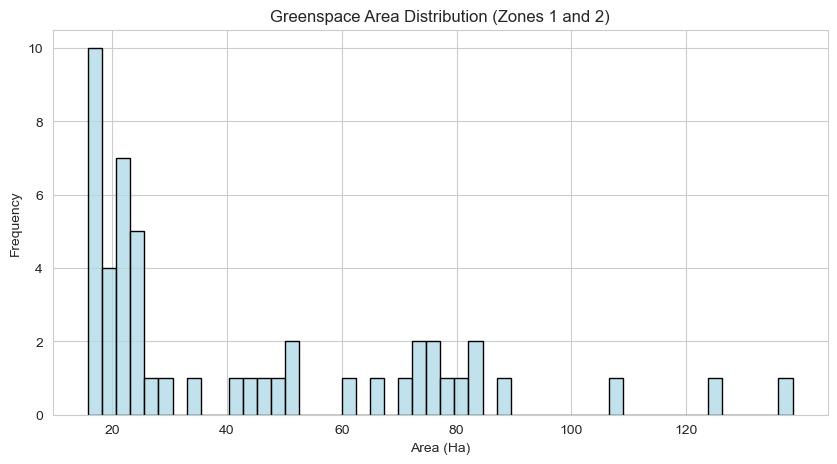

In [90]:
# Histogram of parks sizes I will be running in
plt.figure(figsize=(10,5))
sns.set_style('whitegrid')
palette = {1: '#ADD8E6'}
sns.histplot(top_50_parks['AreaHa'], 
             bins=50,
             color='#ADD8E6', 
             edgecolor='black')
plt.xticks(np.arange(20, top_50_parks['AreaHa'].max(), 20))
plt.title('Greenspace Area Distribution (Zones 1 and 2)')
plt.xlabel('Area (Ha)')
plt.ylabel('Frequency')

In [91]:
# List of all parks
chosen_parks = top_50_parks['SiteName'].tolist()
chosen_parks

['Hyde Park',
 "The Regent's Park",
 'Kensington Gardens',
 'Victoria Park (Tower Hamlets)',
 'Queen Elizabeth Olympic Park',
 'Blackheath',
 'Battersea Park',
 'Tooting Bec Common',
 'Hackney Marshes',
 'Clapham Common',
 'Wormwood Scrubs',
 'Greenwich Park',
 'Beckenham Place Park',
 'Hampstead Heath - East Heath',
 'Putney Heath (North)',
 'Wandsworth Common',
 'Brockwell Park',
 'Oxleas Wood',
 'Hampstead Heath - Kenwood Estate',
 'Peckham Rye Park',
 'Woolwich Common',
 'Bostall Woods',
 'Dulwich Park',
 'Southwark Park',
 'Primrose Hill',
 'Streatham Common',
 'Plumstead Common',
 'Mile End Park',
 'Millfields Park',
 'Avery Hill Park',
 'Clissold Park',
 "St James's Park",
 'Hurlingham Park',
 'Holland Park',
 'Bostall Heath',
 "King George's Park (Wandsworth)",
 'Shepherdleas Wood',
 'The Green Park',
 'Sutcliffe Park',
 'Hilly Fields (Lewisham)',
 'Birchmere Park',
 'Beckenham Place Park Common',
 'Eltham Park South',
 'Hackney Downs',
 'Forster Memorial Park',
 'Hackney Marsh

In [92]:
# Reproject the geometries to WGS84 (latitude and longitude)
top_50_parks = top_50_parks.to_crs(epsg=4326)
top_50_parks['LatLong'] = top_50_parks.geometry.apply(
    lambda geom: [geom.centroid.y, geom.centroid.x] 
    if geom.geom_type in ['Polygon', 'MultiPolygon'] 
    else [None, None])

In [93]:
top_50_parks.head(2)

,SiteName,SiteID,PrimaryUse,Borough,AreaHa,Easting,Northing,Qualifier,Access,DataSource,DataVersio,ReleaseDat,Copyright,geometry,Zone,LatLong
2315,Hyde Park,OS_We_0065,Park,Westminster,138.5339,527543,180257,Centroid,Free,Data source: various,15,Oct 2024,Created by Greenspace Information for Greater ...,"POLYGON ((-0.17437 51.50393, -0.17437 51.50394...",1,"[51.50686405762745, -0.1636333623004647]"
3962,The Regent's Park,OS_MB_0022,Park,Camden,125.1229,528097,182862,Centroid,Free,Data source: various,15,Oct 2024,Created by Greenspace Information for Greater ...,"MULTIPOLYGON (((-0.14584 51.52534, -0.14584 51...",1,"[51.530152785615265, -0.15470764562813402]"


## Connect to the Strava API to get completed parks
I used my Strava access token to fetch all my activites via the API, decoded each run's GPS route using, and checked which routes intersected park boundaries to identify completed parks!!!

In [94]:
# Strava app credentials
CLIENT_ID = "158638"
CLIENT_SECRET = "48e0cb01a2d33e5b3e9df47fb4ecf27ef08715db"
AUTHORIZATION_CODE = "6315151a8c95d594785b3e4699ecf4ed42dca10e"
ACCESS_TOKEN = "7b42f0b2eb3b56cc9c3d018e659926a06bf4b7d9"
REFRESH_TOKEN = "95f675a5026704f611efe55a493d4dfcea2be0ec"

In [95]:
def get_all_activities(client_id, client_secret, refresh_token, max_pages=10, per_page=50):
    """
    Refresh access token and get all Strava activities with full details
    """
    # Refresh access token
    token_response = requests.post(
        url="https://www.strava.com/oauth/token",
        data={
            'client_id': client_id,
            'client_secret': client_secret,
            'grant_type': 'refresh_token',
            'refresh_token': refresh_token
        }
    )
    token_response.raise_for_status()
    access_token = token_response.json()['access_token']
    headers = {'Authorization': f"Bearer {access_token}"}

    # Get activity summaries
    all_activities = []
    for page in range(1, max_pages + 1):
        response = requests.get(
            "https://www.strava.com/api/v3/athlete/activities",
            headers=headers,
            params={'per_page': per_page, 'page': page}
        )
        response.raise_for_status()
        summaries = response.json()
        if not summaries:
            break

        # For each activity, get full details
        for summary in summaries:
            activity_id = summary['id']
            detail_response = requests.get(f"https://www.strava.com/api/v3/activities/{activity_id}", headers=headers)
            detail_response.raise_for_status()
            activity_detail = detail_response.json()
            all_activities.append(activity_detail)

    return all_activities

In [96]:
# Get activites
activities_details = get_all_activities(CLIENT_ID, CLIENT_SECRET, REFRESH_TOKEN)
print(f"I have completed {len(activities_details)} activites on Strava!")

I have completed 49 activites on Strava!


In [97]:
# Use LineString to get routes that intersect with park polygons
completed_parks = []

for act in reversed(activities_details):
    if act.get('type') != 'Run' or not act['map'].get('summary_polyline'):
        continue
    
    # Decode route and convert to shapely LineString
    coords = polyline.decode(act['map']['summary_polyline'])  # lat, lon
    line = LineString([(lon, lat) for lat, lon in coords])  # lon, lat

    # Intersect with park polygons
    matches = top_50_parks[top_50_parks.geometry.intersects(line)]
    
    for park in matches['SiteName']:
        if park not in completed_parks:
            completed_parks.append(park)

print("Parks visited:", completed_parks)

Parks visited: ['Hyde Park', 'Kensington Gardens', "The Regent's Park", 'Hampstead Heath - East Heath', 'Primrose Hill', 'The Green Park', 'Battersea Park', 'Tooting Bec Common', 'Clapham Common', 'Wandsworth Common', "St James's Park", 'Wormwood Scrubs', 'Holland Park']


In [98]:
# Get captions and date for each run 
park_visit_descriptions = {}

# Choose the first time I visited a park if I've gone multiple times
for act in reversed(activities_details):
    if act.get('type') != 'Run' or not act['map'].get('summary_polyline'):
        continue

    coords = polyline.decode(act['map']['summary_polyline'])
    line = LineString([(lon, lat) for lat, lon in coords])

    matched = top_50_parks[top_50_parks.geometry.intersects(line)]

    for park in matched['SiteName']:
        if park not in park_visit_descriptions:
            desc = act.get('description', 'No caption')
            # Parse and format date
            date_str = act['start_date_local']
            date = datetime.strptime(date_str, "%Y-%m-%dT%H:%M:%SZ")
            formatted_date = date.strftime("%B %d, %Y")  # April 25, 2025

            park_visit_descriptions[park] = {'description': desc,
                                             'date': formatted_date}

In [99]:
park_visit_descriptions['Holland Park']

{'description': 'Lovely! Very peaceful and calm and relaxing and love the cutie waterfall',
 'date': 'May 05, 2025'}

In [100]:
# Make a list for remaining parks
remaining_parks = [park for park in top_50_parks['SiteName'] if park not in completed_parks]

In [101]:
# Numbers
print(f"Yay I have ran in {len(completed_parks)} parks!")
print(f"{len(remaining_parks)} parks to go :0")

Yay I have ran in 13 parks!
37 parks to go :0


## Map time yayayay

In [102]:
# Create dictionaries for completed and remaining parks with lat/lon for plotting
top_50_coords = top_50_parks[['SiteName', 'LatLong']]
completed_park_coordinates = top_50_coords[top_50_coords['SiteName'].isin(completed_parks)
                                          ].set_index('SiteName')['LatLong'].to_dict()
remaining_park_coordinates = top_50_coords[top_50_coords['SiteName'].isin(remaining_parks)
                                          ].set_index('SiteName')['LatLong'].to_dict()

In [103]:
# Blue spaces to shade on map
my_bluespaces = gdf[gdf['PrimaryUse'].isin(['River', 'Canal', 'Sewage/water works'])]
bluespaces = my_bluespaces[my_bluespaces['AreaHa'] >= 10]

In [104]:
# Removing white background from tree image

# Load image as array
tree = cv2.imread("map_icons/tree.png")
# BGR (Blue green red) -> gray
gray = cv2.cvtColor(tree, cv2.COLOR_BGR2GRAY)
# Binary mask so background is set to white (isolate white background)
_, mask = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)
# Invert mask so the background is black
mask = cv2.bitwise_not(mask)
# Convert to BGRA (blue green red alpha)
# Alpha controls transparency
image_rgba = cv2.cvtColor(tree, cv2.COLOR_BGR2BGRA)
# Apply the mask to the alpha channel, converting anything black to transparent
image_rgba[:, :, 3] = mask
# Save as png
cv2.imwrite("map_icons/tree_no_background.png", image_rgba)

True

In [105]:
# Load image as array
tree = cv2.imread("map_icons/tree.png")


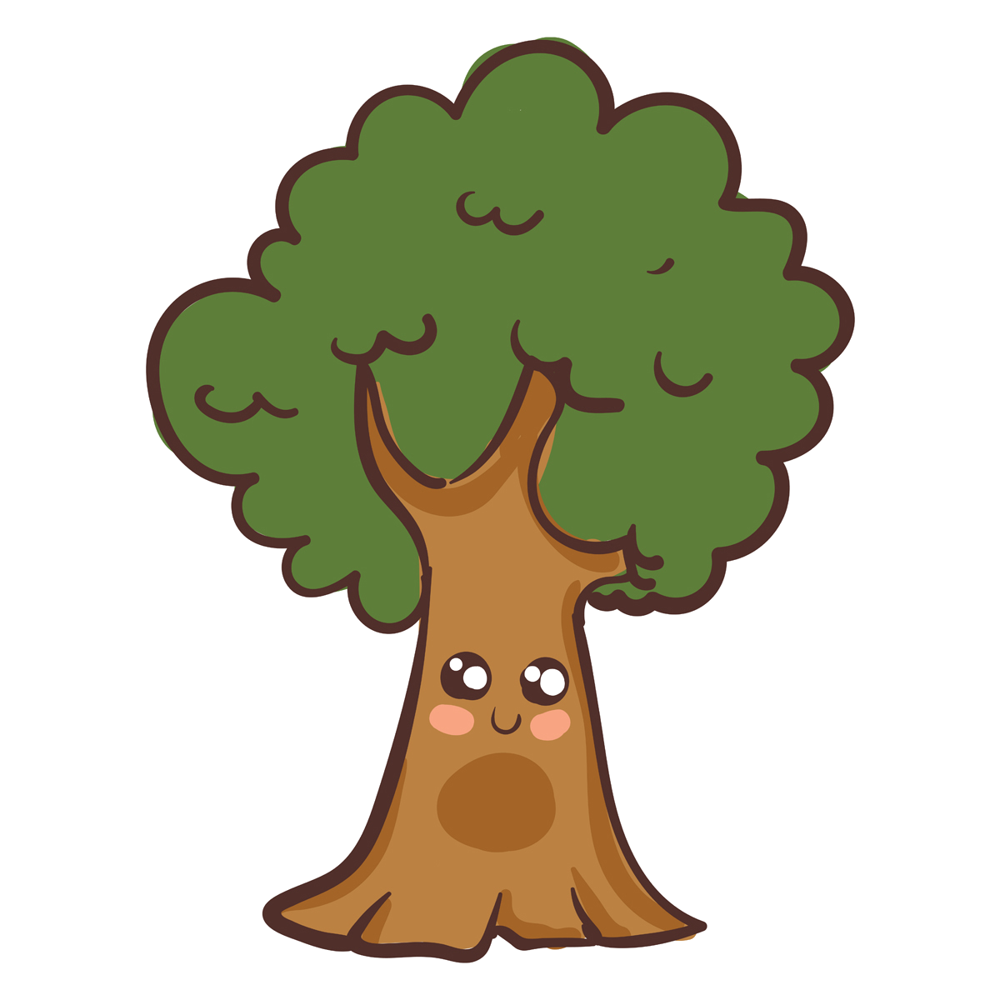
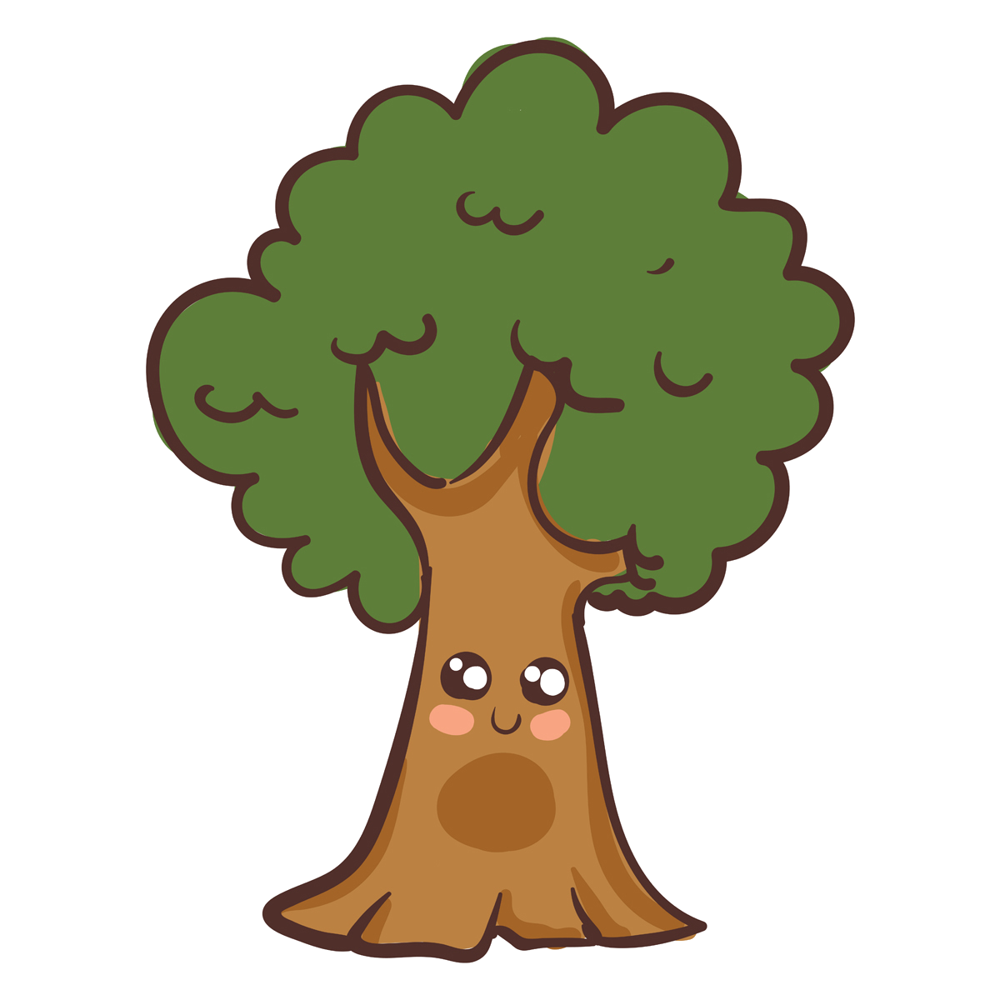
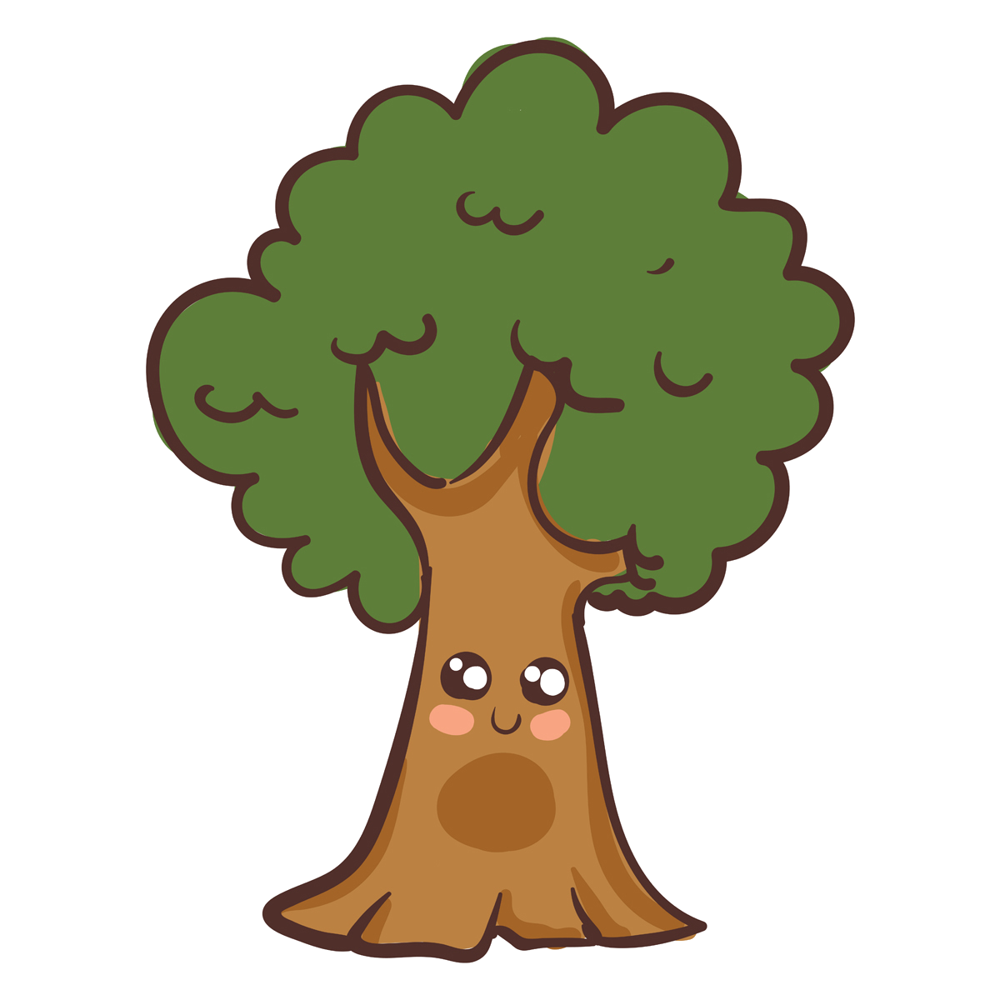
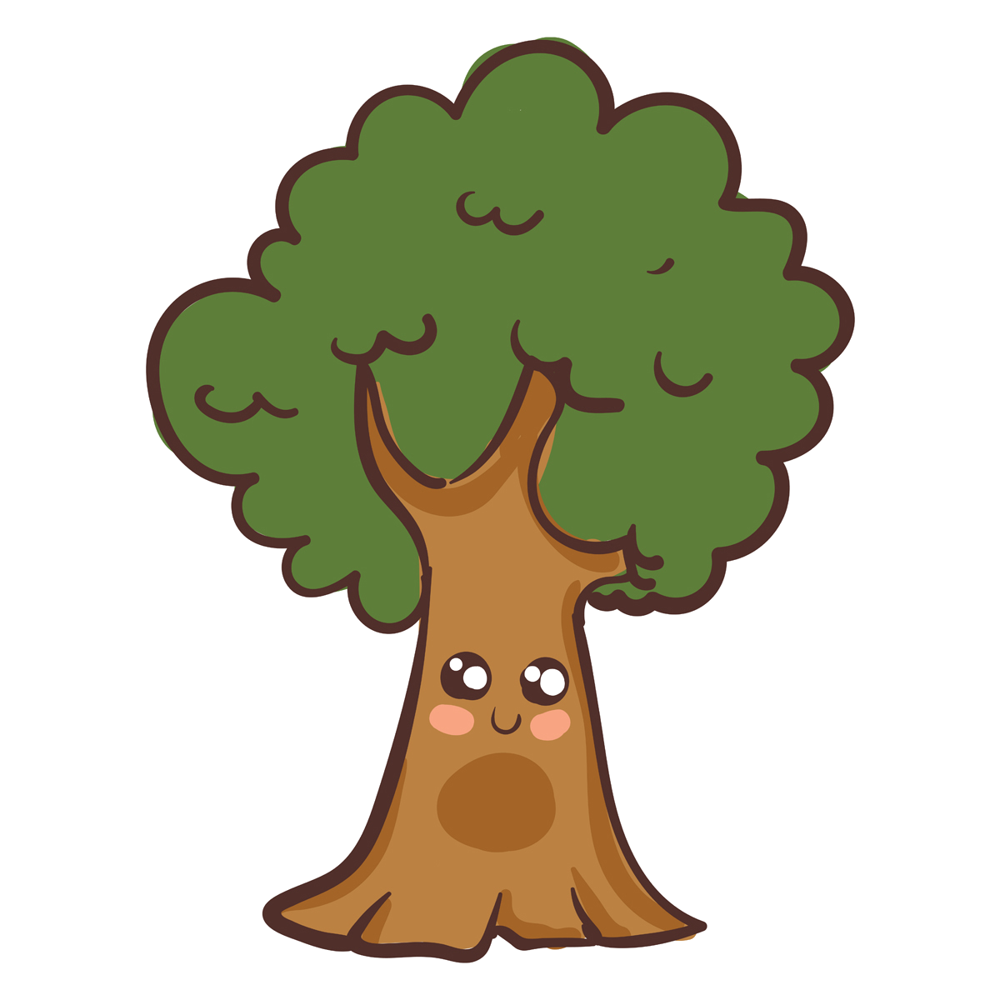
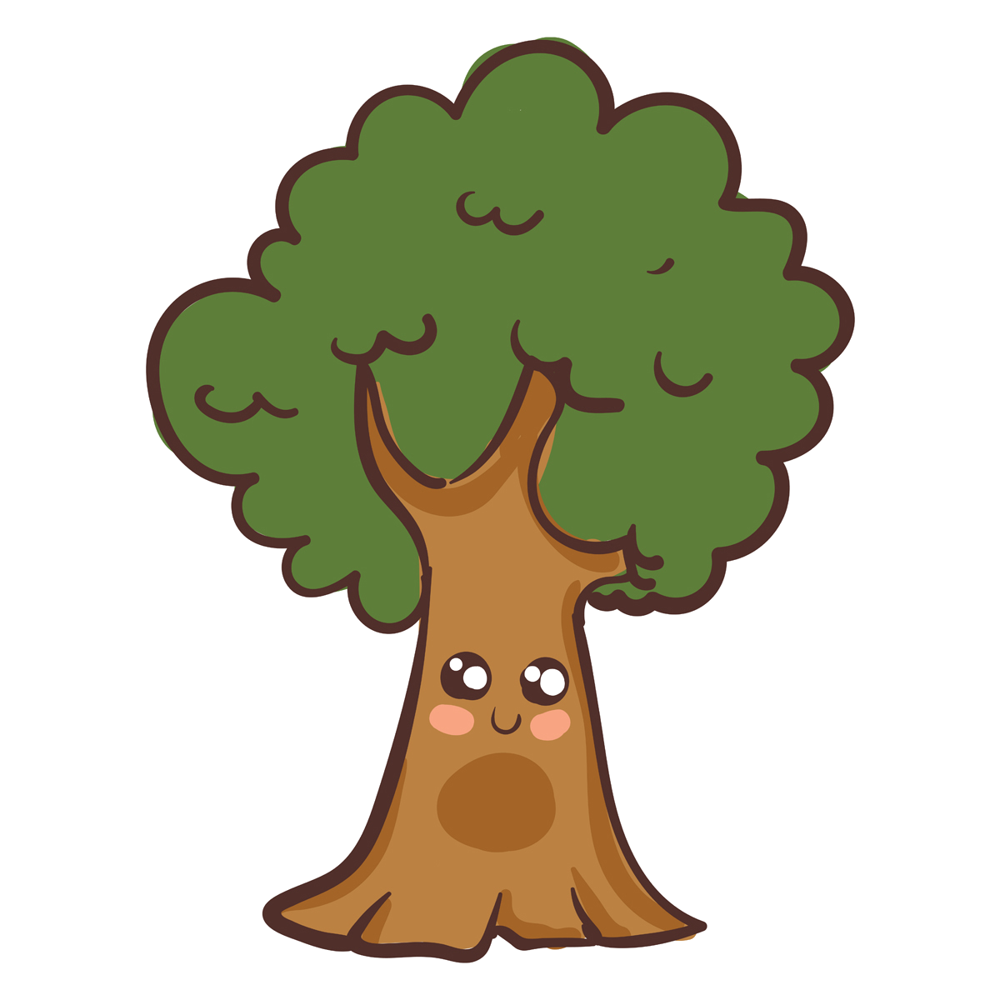
...
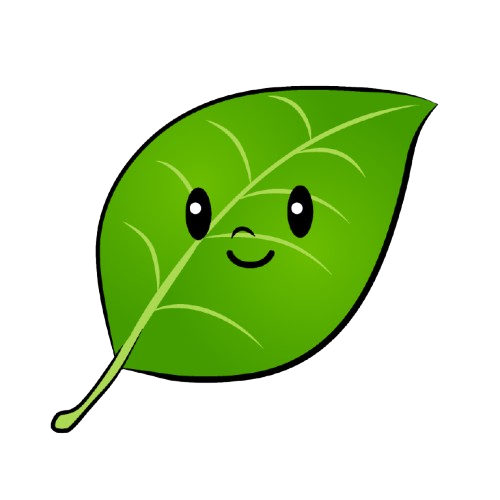
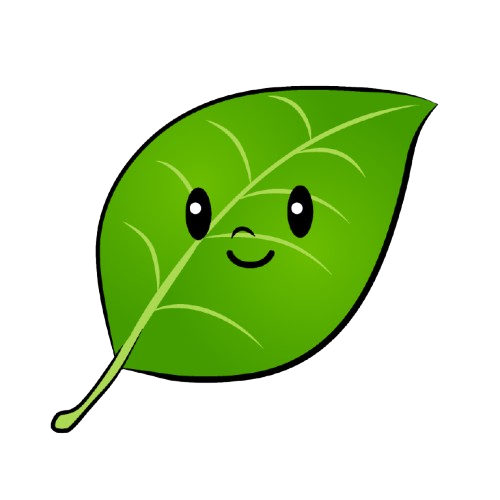
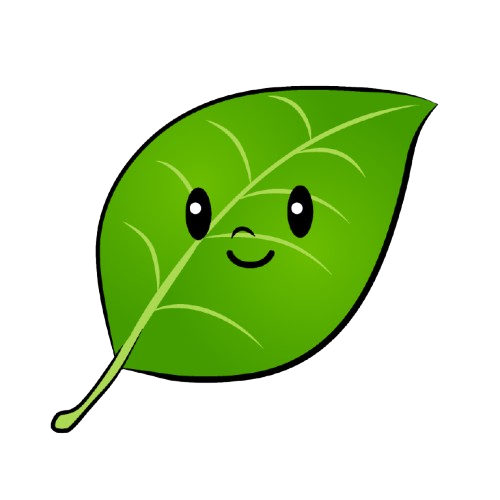
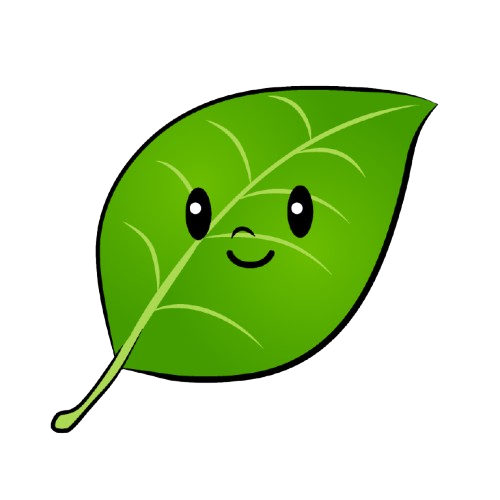
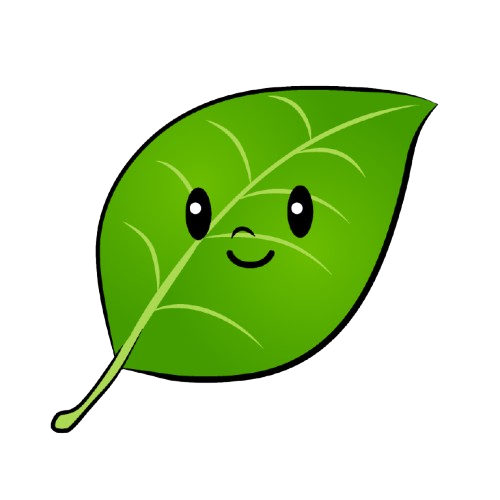

In [106]:
# Define the map
m = folium.Map(location=[51.495, -0.08], 
               zoom_start=11, 
               tiles="CartoDB Positron")

# Shading in parks
folium.GeoJson(
    top_50_parks.geometry,
    name='Selected Parks',
    control=False,
    style_function=lambda x: {'fillColor': 'green', 'color': '#4CAF50', 'weight': 1, 'fillOpacity': 0.2},
).add_to(m)

# Shading in bluespaces
folium.GeoJson(
    bluespaces.geometry,
    control=False,
    name='Blue Spaces',
    style_function=lambda x: {'fillColor': '#93b9e1', 'color': '#93b9e1', 'weight': 1, 'fillOpacity': 0.2},
).add_to(m)

# Adding trees for completed parks, include park name, date, and caption in the marker
for park, coords in completed_park_coordinates.items():
    info = park_visit_descriptions.get(park, {})
    desc = info.get('description', 'No caption')
    date = info.get('date', 'Unknown date')

    popup_html = f"""
    <div style="font-family:sans-serif; font-size:13px;">
    <b style="font-size:14px;">{park.upper()}</b><br>
    <i>{date}</i><br>
    {desc}
    </div>
    """
    folium.Marker(
        location=coords,
        icon=folium.CustomIcon("map_icons/tree_no_background.png", icon_size=(40, 40)),
        popup=folium.Popup(popup_html, max_width=300)
    ).add_to(m)

    
# Add leaf markers for non completed parks
for park, coords in remaining_park_coordinates.items():
    folium.Marker(
        location=coords,
        icon=folium.CustomIcon("map_icons/leaf.png", icon_size=(35, 35)),
        popup=park
    ).add_to(m)

# Display map
m

## Heatmap
For fun, I also used the routes from Strava to plot a heatmap with all of my routes on it

In [107]:
# Define the map
heatmap = folium.Map(location=[51.5074, -0.1278], 
                     zoom_start=11.5,
                     tiles="CartoDB DarkMatter",
                     attr="© OpenStreetMap contributors, © CARTO")

# Add route lines to heatmap
for act in activities_details:
    if act.get('type') != 'Run' or not act['map'].get('summary_polyline'):
        continue
    
    coords = polyline.decode(act['map']['summary_polyline'])
    
    # Add to folium map as a polyline
    folium.PolyLine(
        locations=coords,
        color='pink',
        weight=2,
        opacity=0.8,
        tooltip=act.get('name', 'Run')
    ).add_to(heatmap)

# Display the map
heatmap